<center><h1> Procesamiento Digital de Señales</h1> </center>
<center><h1>  Proyecto Final</h1> </center>
<center><h1>  Sebastian Bonilla</h1> </center>
<center><h1> Alexander Passo</h1> </center>

In [1]:
#Librerias
import numpy as np                  # Libreria numerica
import matplotlib.pyplot as plt     # Libreria grafica
import scipy.signal as sp           # Libreria de senales
from numpy import pi                # Importa PI de numpy
from scipy.io.wavfile import read   # Libreria para leer archivos wav
from IPython.display import Audio   # Libreria para reproducir archivos wav
import math
%matplotlib inline

## Parte 1: Extracción instrumentos canción: tu_con_el

In [2]:
file_name = "tu_con_el.wav"                # Nombre del archivo de audio
fs1, x1 = read(file_name)                 # Leer el archivo y extraer su frecuencia de muestreo y amplitud
x1 = x1[:, 1]                             # Convierte el audio de estereo a mono
x1 = x1 / max(abs(x1))                     # Normalizar la señal
t1 = np.arange(0, len(x1) / fs1, 1 / fs1)   # Vector de tiempo

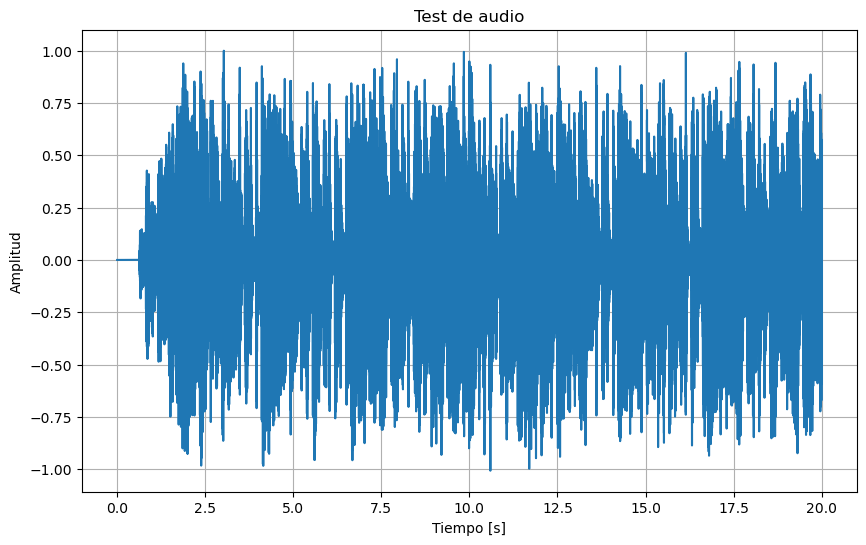

In [3]:
# Grafica de la señal de audio
plt.figure(figsize=(10,6))
plt.plot(t1, x1)
plt.title('Test de audio')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

Audio(x1, rate=fs1)   # Reproducir el audio

### Espectro de la señal de audio: tu_con_el

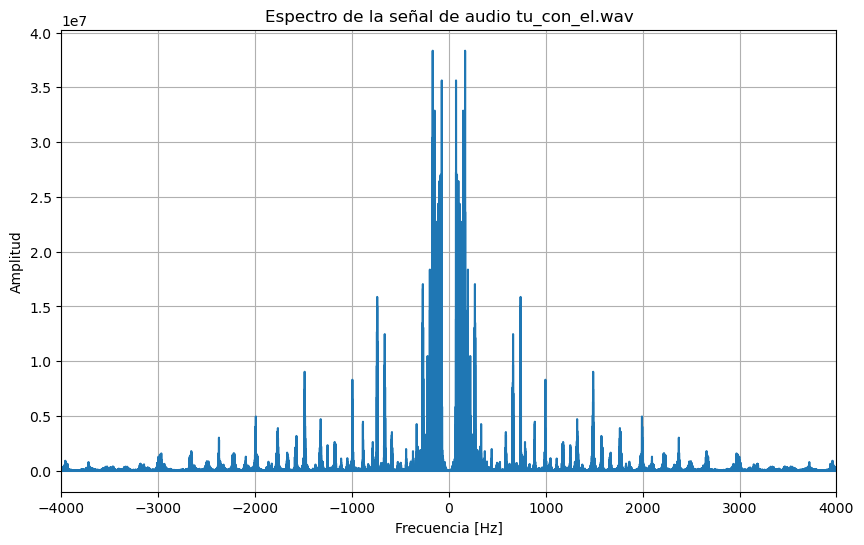

In [4]:
X1 = np.fft.fft(x1)                       # Transformada de Fourier
X_freq1 = np.fft.fftfreq(len(x1)) * fs1    # Vector de frecuencias

plt.figure(figsize=(10,6))
# Grafica del espectro de la señal de audio
plt.plot(X_freq1, abs(X1) ** 2)
plt.title(f'Espectro de la señal de audio {file_name}')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-4000, 4000])
plt.grid()
plt.show()

### Extrayendo primer instrumento: El Bajo

Se diseña un filtro pasa bajas, suponiendo un rizado del 4%


In [5]:
ripple_dB = 20*math.log(0.004,10)
print(f"Ripple en dB = {ripple_dB} dB")

Ripple en dB = -47.95880017344074 dB


In [6]:
#Usando una ventana de Hamming
fm = 10                # Ancho de banda de transición.
fc = 280                # Frecuencia de corte.
M = 4 * (fs1 / fm)     # Número de muestras - ventana hamming.
if (M % 2 == 0):        # Si M no es impar, la hace impar.
    M = M + 1
M = int(M)              # M debe ser entero.
print("M =", M)         # Imprime el orden del filtro.

M = 17641


In [7]:
wc1 = 2 * pi * (fc / fs1)                 # frecuencia de corte normalizada en radianes
n = np.arange(-M // 2 + 1, M // 2 + 1)  # Vector de muestras
hi = (wc1 / pi) * np.sinc(wc1 * n / pi)   # Respuesta del filtro ideal
win = np.ones(M)                    # Ventana rectangular
hn = hi * win                           # Multiplico la respuesta ideal por la ventana
w, h = sp.freqz(hn, 1, whole=True)      # Respuesta en frecuencia del filtro

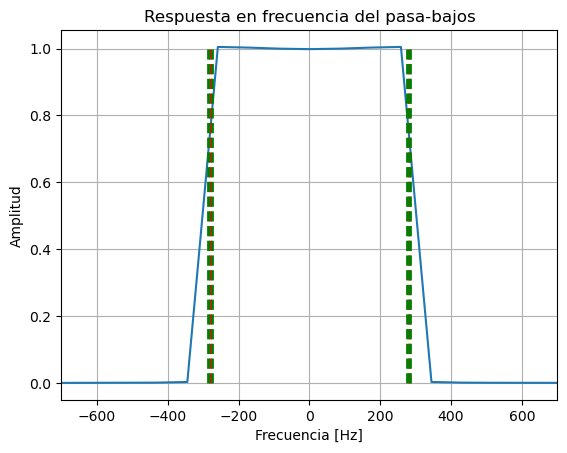

In [8]:
plt.plot((w - pi) * fs1 / (2 * pi), np.abs(np.fft.fftshift(h)), label='Filtro')
plt.vlines(fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(fc + fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(fc - fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(-(fc + fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-(fc - fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.title('Respuesta en frecuencia del pasa-bajos')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-700, 700])
plt.grid()
plt.show()

In [9]:
# Filtrado de la señal de audio
y = np.convolve(hn, x1, mode="same")     # Se filtra la señal requerida
Y = np.fft.fft(y)                       # FFT de la señal filtrada para mostrarla mas comodamente
Y_freq = np.fft.fftfreq(len(Y)) * fs1    # Vector de frecuencias

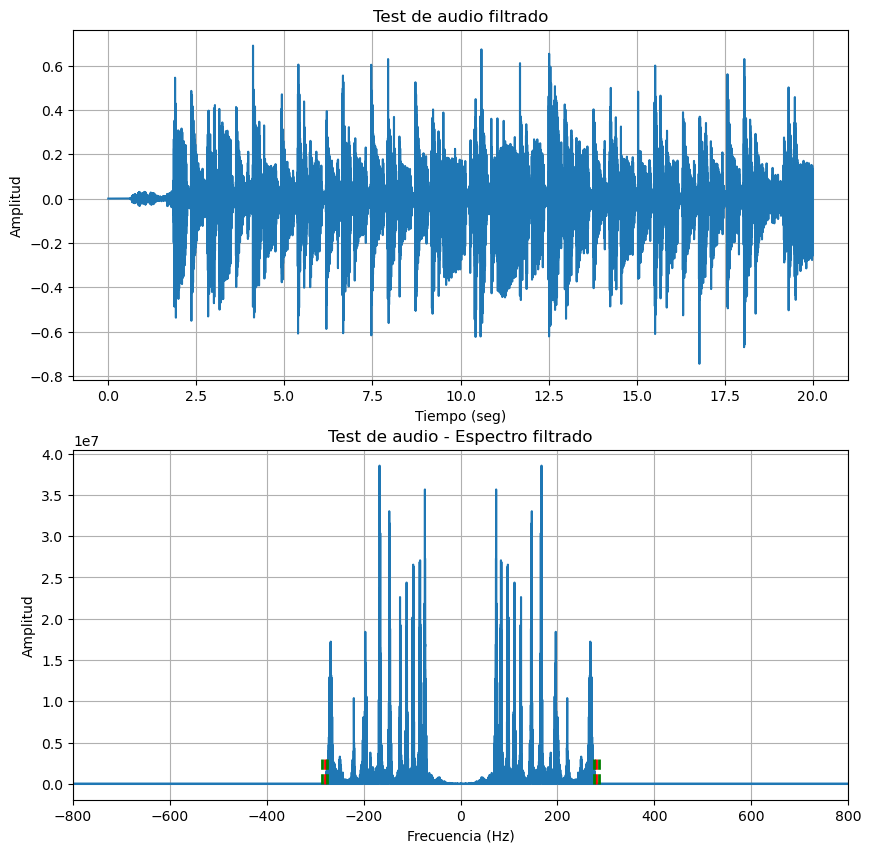

In [10]:
# Grafico de la señal filtrada
plt.figure(figsize=(10, 10))

plt.subplot(211)
plt.plot(t1, y)
plt.title('Test de audio filtrado')
plt.xlabel('Tiempo (seg)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(212)
plt.plot(Y_freq, abs(Y) ** 2)
plt.vlines(fc, 0, 3e6, color='r', lw=2, linestyle='--')
plt.vlines(fc + fm / 2, 0, 3e6, color='g', lw=2, linestyle='--')
plt.vlines(fc - fm / 2, 0, 3e6, color='g', lw=2, linestyle='--')
plt.vlines(-fc, 0, 3e6, color='r', lw=2, linestyle='--')
plt.vlines(-(fc + fm / 2), 0, 3e6, color='g', lw=2, linestyle='--')
plt.vlines(-(fc - fm / 2), 0, 3e6, color='g', lw=2, linestyle='--')
plt.title('Test de audio - Espectro filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-800, 800])
plt.grid()

plt.show()

#Escuchar audio Filtrado
Audio(y, rate=fs1)

### Extrayendo Segundo Instrumento (Percución) con filtro Pasa Banda

In [11]:
#Usando una ventana de Hamming
fm = 5                # Ancho de banda de transición.
M = 4 * (fs1 / fm)     # Número de muestras - ventana hamming.
if (M % 2 == 0):        # Si M no es impar, la hace impar.
    M = M + 1
M = int(M)              # M debe ser entero.
print("M =", M)         # Imprime el orden del filtro.

fc1 = 200                                   # Frecuencia de corte 1
fc2 = 550                                   # Frecuencia de corte 2
wc1 = 2 * pi * fc1 / fs1                     # frecuencia de corte 1 normalizada en radianes
wc2 = 2 * pi * fc2 / fs1                     # frecuencia de corte 2 normalizada en radianes
n = np.arange(-M // 2 + 1, M // 2 + 1)      # Vector de muestras
hi = (wc2 / pi) * np.sinc(wc2 * n / pi) - (wc1 / pi) * np.sinc(wc1 * n / pi)  # Respuesta del filtro ideal
hi[M//2] = (wc2 - wc1) / np.pi          # cuando es pasabanda
win = np.ones(M)                            # Ventana rectangular
hn = hi * win                               # Multiplico la respuesta ideal por la ventana
w, h = sp.freqz(hn, 1, whole=True)          # Respuesta en frecuencia del filtro

M = 35281


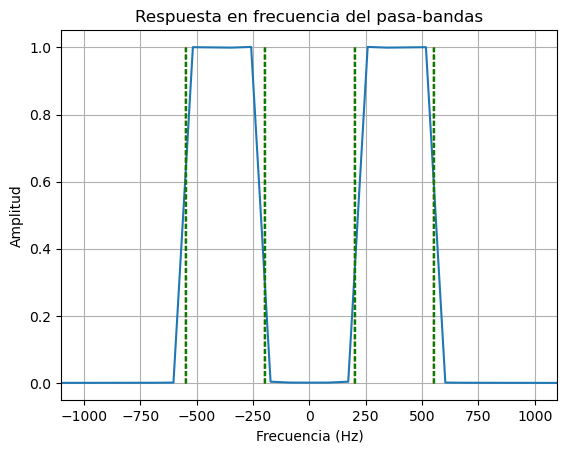

In [12]:
# Grafica del filtro pasa-banda
plt.plot((w - pi) * fs1 / (2 * pi), np.abs(np.fft.fftshift(h)), label='Filtro')
plt.vlines(fc1, 0, 1, color='r', lw=1, linestyle='--')
plt.vlines(fc2, 0, 1, color='r', lw=1, linestyle='--')
plt.vlines(-fc1, 0, 1, color='r', lw=1, linestyle='--')
plt.vlines(-fc2, 0, 1, color='r', lw=1, linestyle='--')
plt.vlines(fc1 + fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(fc2 + fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(-fc1 - fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(-fc2 - fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(fc1 - fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(fc2 - fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(-fc1 + fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.vlines(-fc2 + fm / 2, 0, 1, color='g', lw=1, linestyle='--')
plt.title('Respuesta en frecuencia del pasa-bandas')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-1100, 1100])
plt.grid()
plt.show()

In [13]:
# Filtrado de la señal de audio
y = np.convolve(hn, x1, mode="same")     # Se filtra la señal requerida
Y = np.fft.fft(y)                       # FFT de la señal filtrada para mostrarla mas comodamente
Y_freq = np.fft.fftfreq(len(Y)) * fs1    # Vector de frecuencias

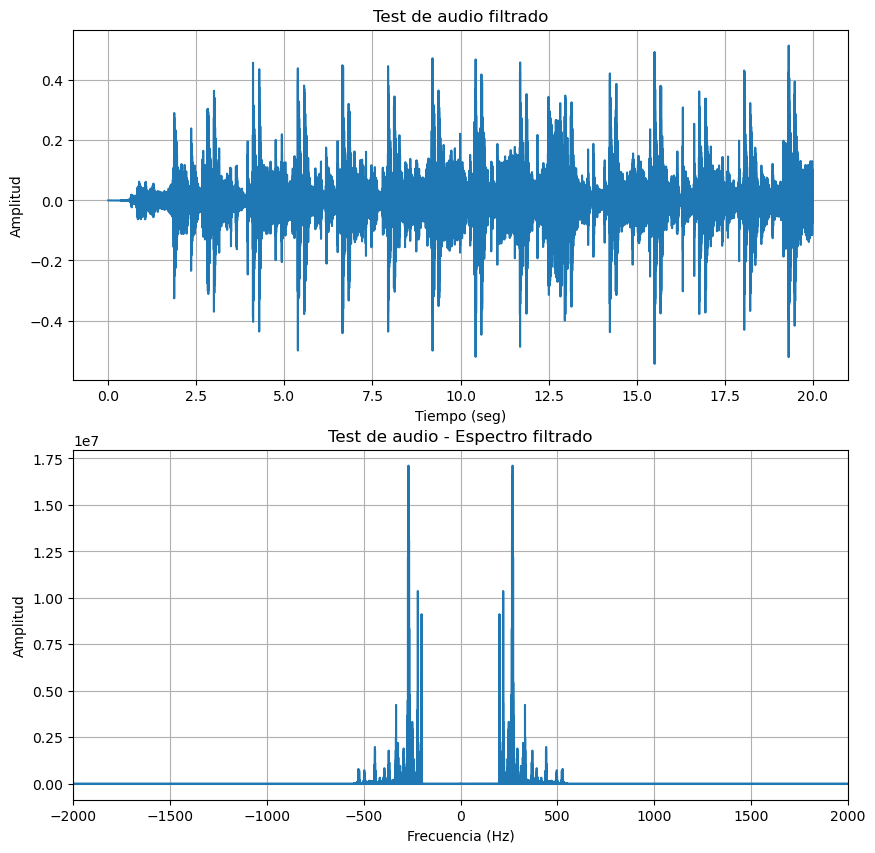

In [14]:

plt.figure(figsize=(10, 10))

plt.subplot(211)
plt.plot(t1, y)
plt.title('Test de audio filtrado')
plt.xlabel('Tiempo (seg)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(212)
plt.plot(Y_freq, abs(Y) ** 2)
plt.title('Test de audio - Espectro filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-2000, 2000])
plt.grid()

plt.show()

#Escuchar señal filtrada
Audio(y, rate=fs1)

### Extrayendo ultimo instrumento filtro pasa alta: trompetas

In [15]:
#Usando una ventana de Hamming
fm = 20                # Ancho de banda de transición.
M = 4 * (fs1 / fm)     # Número de muestras - ventana hamming.
if (M % 2 == 0):        # Si M no es impar, la hace impar.
    M = M + 1
M = int(M)              # M debe ser entero.
print("M =", M)         # Imprime el orden del filtro.

fc=500
wc = 2 * pi * fc / fs1                   # frecuencia de corte normalizada en radianes
n = np.arange(-M // 2 + 1, M // 2 + 1)  # Vector de muestras

# Se crea la función delta que se usa
# para genarar el filtro pasa-altos
delta = np.zeros(len(n))
delta[M // 2] = 1

hi = (wc / pi) * np.sinc(wc * n / pi)   # Respuesta del filtro ideal
hi = delta - hi                         # Se aplica la reversión espectral
win = np.ones(len(n))                   # Ventana rectangular
hn = hi * win                           # Multiplico la respuesta ideal por la ventana
w, h = sp.freqz(hn, 1, whole=True)      # Respuesta en frecuencia del filtro


M = 8821


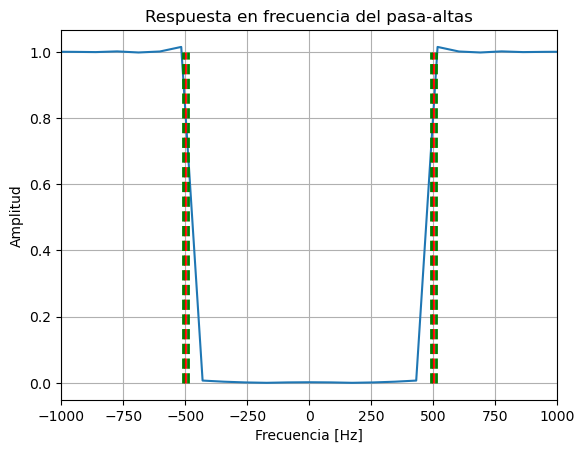

In [16]:
plt.plot((w - pi) * fs1 / (2 * pi), np.abs(np.fft.fftshift(h)), label='Filtro')
plt.vlines(fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(fc + fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(fc - fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(-(fc + fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-(fc - fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.title('Respuesta en frecuencia del pasa-altas')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-1000, 1000])
plt.grid()
plt.show()

In [17]:
# Filtrado de la señal de audio
y = np.convolve(hn, x1, mode="same")     # Se filtra la señal requerida
Y = np.fft.fft(y)                       # FFT de la señal filtrada para mostrarla mas comodamente
Y_freq = np.fft.fftfreq(len(Y)) * fs1    # Vector de frecuencias

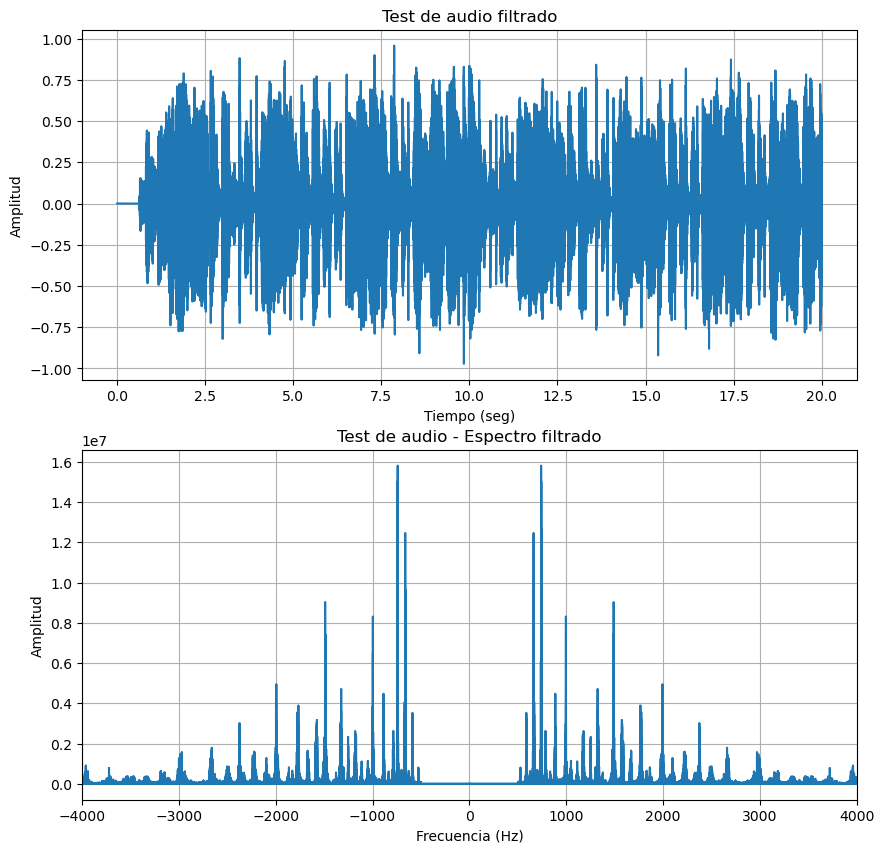

In [18]:
plt.figure(figsize=(10, 10))

plt.subplot(211)
plt.plot(t1, y)
plt.title('Test de audio filtrado')
plt.xlabel('Tiempo (seg)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(212)
plt.plot(Y_freq, abs(Y) ** 2)
plt.title('Test de audio - Espectro filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-4000, 4000])
plt.grid()

plt.show()

#Escuchar señal filtrada
Audio(y, rate=fs1)

## Parte 2: Extracción de instrumentos de la canción: lloraras

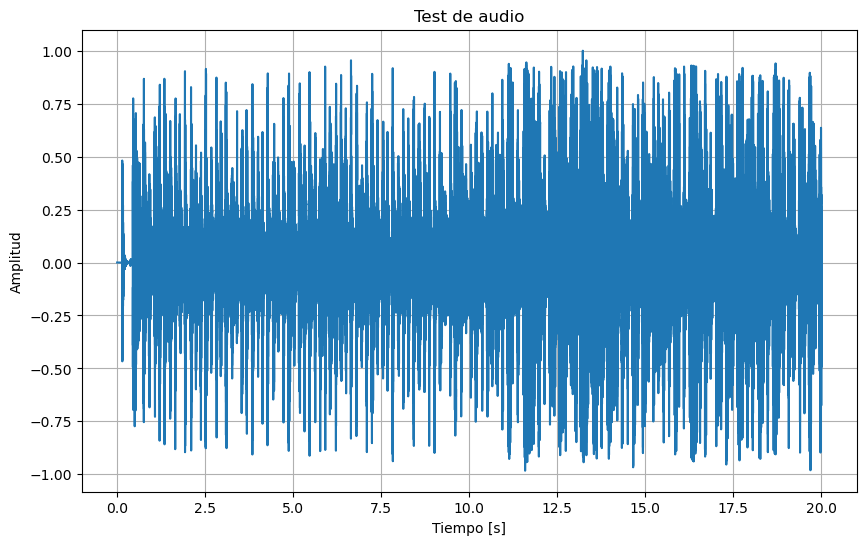

In [19]:
file_name = "lloraras.wav"                # Nombre del archivo de audio
fs2, x2 = read(file_name)                 # Leer el archivo y extraer su frecuencia de muestreo y amplitud
x2 = x2[:, 1]                             # Convierte el audio de estereo a mono
x2 = x2 / max(abs(x2))                     # Normalizar la señal
t2 = np.arange(0, len(x2) / fs2, 1 / fs2)   # Vector de tiempo

# Grafica de la señal de audio
plt.figure(figsize=(10, 6))
plt.plot(t2, x2)
plt.title('Test de audio')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

#Reproducir audio
Audio(x2, rate=fs2)   # Reproducir el audio


In [20]:
X2 = np.fft.fft(x2)                       # Transformada de Fourier
X_freq2 = np.fft.fftfreq(len(x2)) * fs2    # Vector de frecuencias

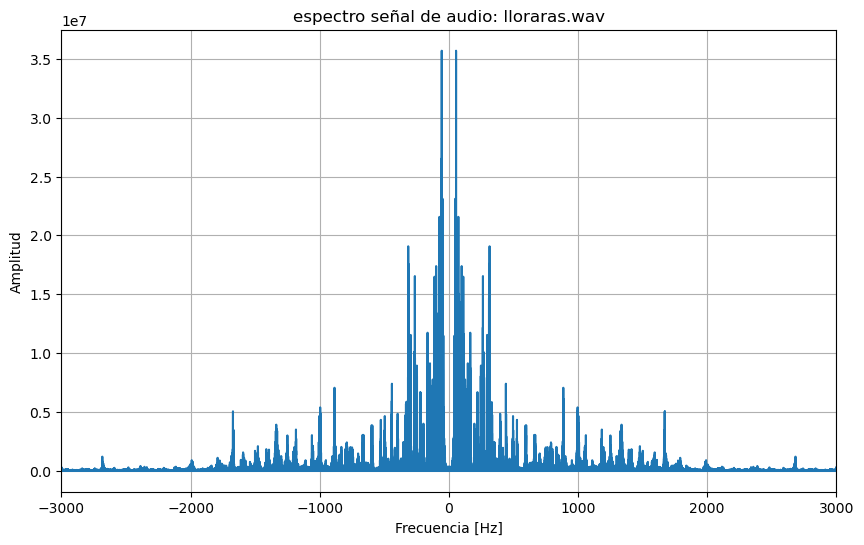

In [21]:
# Grafica del espectro de la señal de audio
plt.figure(figsize=(10, 6))
plt.plot(X_freq2, abs(X2) ** 2)
plt.title(f'espectro señal de audio: {file_name}')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-3000, 3000])
plt.grid()
plt.show()

In [22]:
ripple_db = 20*math.log(0.1,10)
print(f'Ripple : {ripple_db} dB')

Ripple : -19.999999999999996 dB


In [23]:
#Usando una ventana  rectangular 
fm = 10                # Ancho de banda de transición.
fc = 180                # Frecuencia de corte.
M = 2 * (fs2 / fm) - 1   # Número de muestras - ventana rectangular.
if (M % 2 == 0):        # Si M no es impar, la hace impar.
    M = M + 1
M = int(M)              # M debe ser entero.
print("M =", M)         # Imprime el orden del filtro.

M = 9599


In [24]:
wc1 = 2 * pi * (fc / fs2)                 # frecuencia de corte normalizada en radianes
n = np.arange(-M // 2 + 1, M // 2 + 1)  # Vector de muestras
hi = (wc1 / pi) * np.sinc(wc1 * n / pi)   # Respuesta del filtro ideal
win = np.ones(M)                    # Ventana rectangular
hn = hi * win                           # Multiplico la respuesta ideal por la ventana
w, h = sp.freqz(hn, 1, whole=True)      # Respuesta en frecuencia del filtro

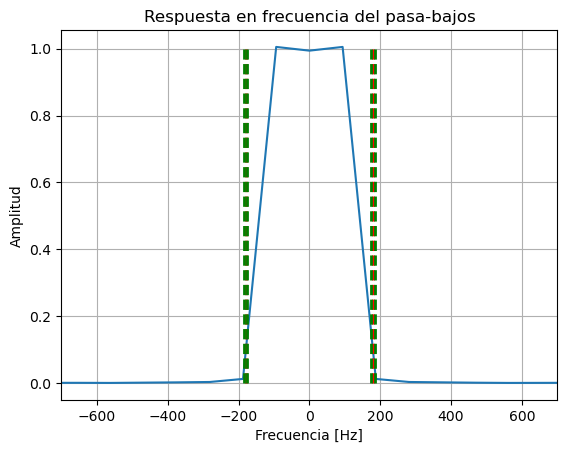

In [25]:
# Grafica del filtro pasa-bajos
plt.plot((w - pi) * fs2 / (2 * pi), np.abs(np.fft.fftshift(h)), label='Filtro')
plt.vlines(fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(fc + fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(fc - fm / 2, 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-fc, 0, 1, color='r', lw=2, linestyle='--')
plt.vlines(-(fc + fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.vlines(-(fc - fm / 2), 0, 1, color='g', lw=2, linestyle='--')
plt.title('Respuesta en frecuencia del pasa-bajos')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-700, 700])
plt.grid()
plt.show()

In [26]:
# Filtrado de la señal de audio
y2 = np.convolve(hn, x2, mode="same")     # Se filtra la señal requerida
Y2 = np.fft.fft(y2)                       # FFT de la señal filtrada para mostrarla mas comodamente
Y2_freq = np.fft.fftfreq(len(Y2)) * fs2    # Vector de frecuencias

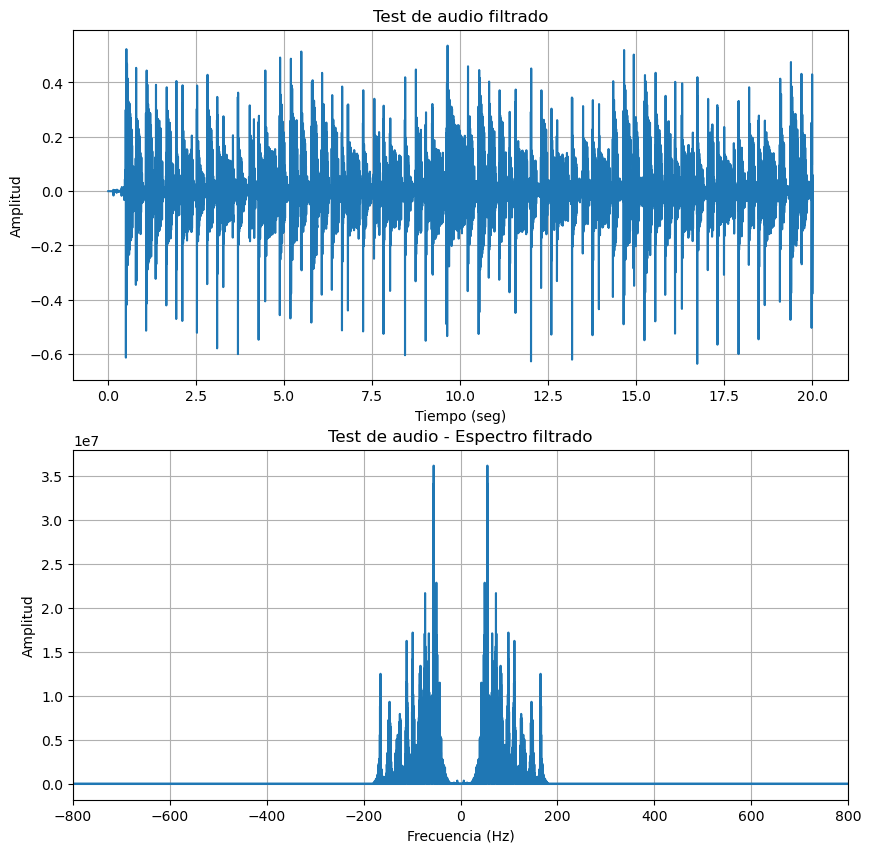

In [27]:
# Grafico de la señal filtrada
plt.figure(figsize=(10, 10))

plt.subplot(211)
plt.plot(t2, y2)
plt.title('Test de audio filtrado')
plt.xlabel('Tiempo (seg)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(212)
plt.plot(Y2_freq, abs(Y2) ** 2)
plt.title('Test de audio - Espectro filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-800, 800])
plt.grid()

plt.show()

#reproducir audio filtrado
Audio(y2, rate=fs2)

## Parte 3: Extracción del instrumento: Marimba. Canción: Vive a tu manera

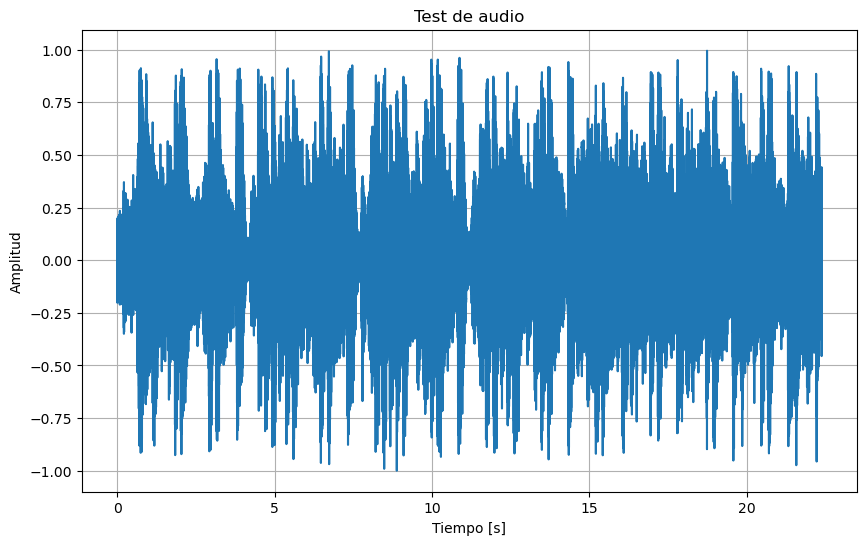

In [28]:
file_name = "vive_a_tu_manera.wav"                # Nombre del archivo de audio
fs3, x3 = read(file_name)                 # Leer el archivo y extraer su frecuencia de muestreo y amplitud
x3 = x3[:, 1]                             # Convierte el audio de estereo a mono
x3 = x3 / max(abs(x3))                     # Normalizar la señal
t3 = np.arange(0, len(x3) / fs3, 1 / fs3)   # Vector de tiempo

# Grafica de la señal de audio
plt.figure(figsize=(10, 6))
plt.plot(t3, x3)
plt.title('Test de audio')
plt.xlabel('Tiempo [s]')
plt.ylabel('Amplitud')
plt.grid()
plt.show()

#Reproducir audio
Audio(x3, rate=fs3)   # Reproducir el audio

In [29]:
X3 = np.fft.fft(x3)                       # Transformada de Fourier
X_freq3 = np.fft.fftfreq(len(x3)) * fs3    # Vector de frecuencias

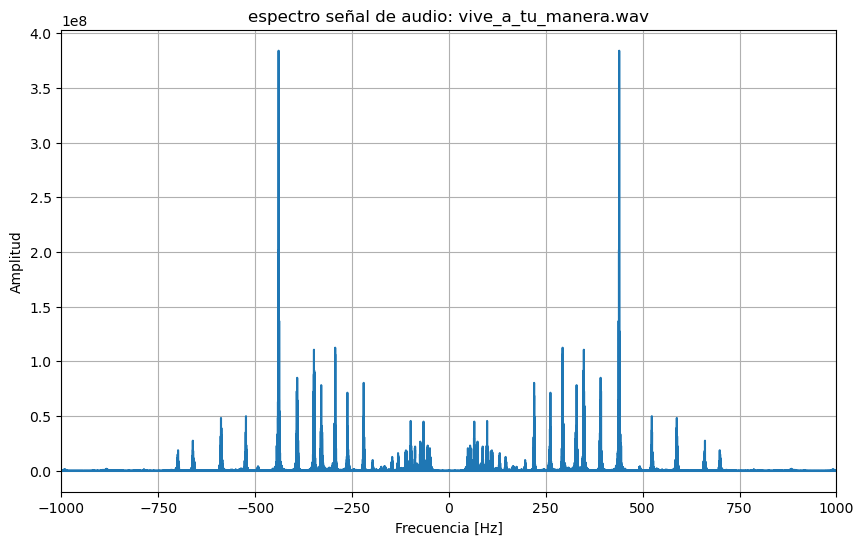

In [30]:
# Grafica del espectro de la señal de audio
plt.figure(figsize=(10, 6))
plt.plot(X_freq3, abs(X3) ** 2)
plt.title(f'espectro señal de audio: {file_name}')
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.xlim([-1000, 1000])
plt.grid()
plt.show()

In [31]:

#Usando una ventana de Hamming
fm = 5                # Ancho de banda de transición.
M = 4 * (fs1 / fm)     # Número de muestras - ventana hamming.
if (M % 2 == 0):        # Si M no es impar, la hace impar.
    M = M + 1
M = int(M)              # M debe ser entero.
print("M =", M)         # Imprime el orden del filtro.

fc1 = 250                                   # Frecuencia de corte 1
fc2 = 500                                   # Frecuencia de corte 2
wc1 = 2 * pi * fc1 / fs1                     # frecuencia de corte 1 normalizada en radianes
wc2 = 2 * pi * fc2 / fs1                     # frecuencia de corte 2 normalizada en radianes
n = np.arange(-M // 2 + 1, M // 2 + 1)      # Vector de muestras
hi = (wc2 / pi) * np.sinc(wc2 * n / pi) - (wc1 / pi) * np.sinc(wc1 * n / pi)  # Respuesta del filtro ideal
hi[M//2] = (wc2 - wc1) / np.pi          # cuando es pasabanda
win = np.ones(M)                            # Ventana rectangular
hn = hi * win                               # Multiplico la respuesta ideal por la ventana
w, h = sp.freqz(hn, 1, whole=True)          # Respuesta en frecuencia del filtro

M = 35281


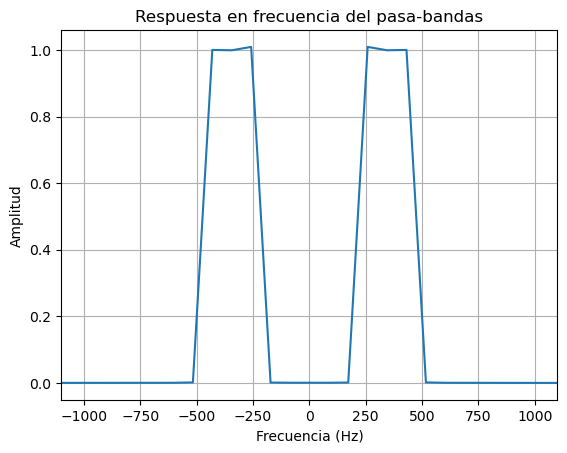

In [32]:
# Grafica del filtro pasa-altos
plt.plot((w - pi) * fs1 / (2 * pi), np.abs(np.fft.fftshift(h)), label='Filtro')
plt.title('Respuesta en frecuencia del pasa-bandas')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-1100, 1100])
plt.grid()
plt.show()

In [33]:
# Filtrado de la señal de audio
y3 = np.convolve(hn, x3, mode="same")     # Se filtra la señal requerida
Y3 = np.fft.fft(y3)                       # FFT de la señal filtrada para mostrarla mas comodamente
Y3_freq = np.fft.fftfreq(len(Y3)) * fs3    # Vector de frecuencias

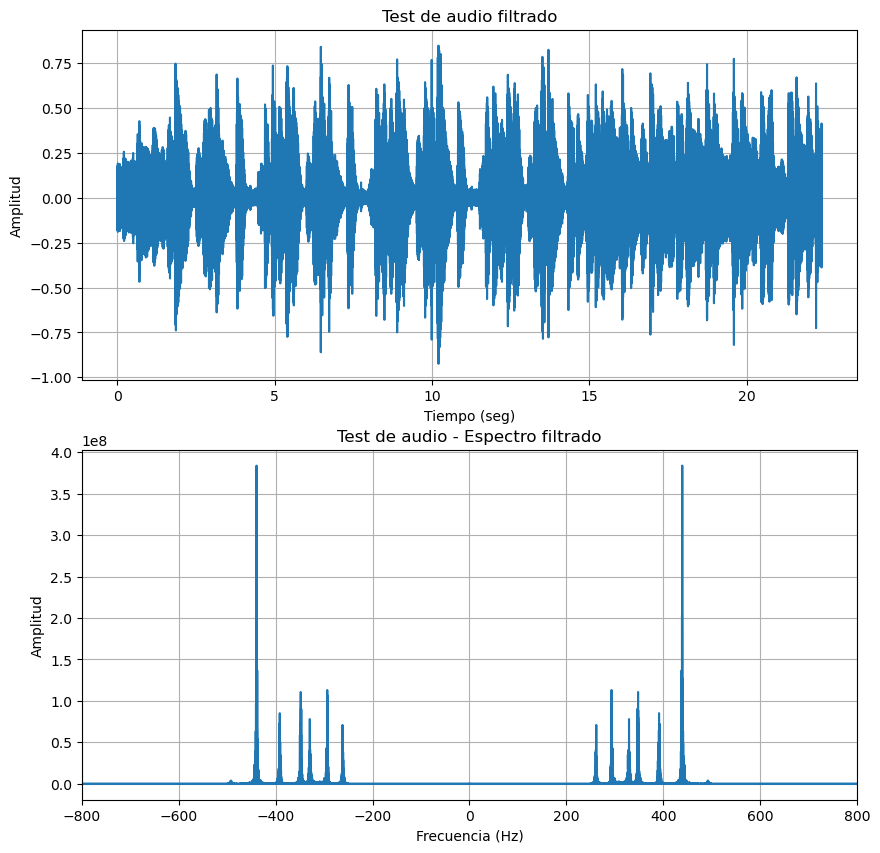

In [34]:
plt.figure(figsize=(10, 10))

plt.subplot(211)
plt.plot(t3, y3)
plt.title('Test de audio filtrado')
plt.xlabel('Tiempo (seg)')
plt.ylabel('Amplitud')
plt.grid()

plt.subplot(212)
plt.plot(Y3_freq, abs(Y3) ** 2)
plt.title('Test de audio - Espectro filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.xlim([-800, 800])
plt.grid()

plt.show()

#Escuchar señal filtrada
Audio(y3, rate=fs3)